# Solar System Object observation association for LSST 
## demonstrated with DECam HiTS 2015 dataset

In [1]:
import sso_association as sso

In [35]:
import pandas as pd
import numpy as np

In [2]:
# Download MPCORB file

In [3]:
sso.getmpcorb()

Download complete: https://minorplanetcenter.net/iau/MPCORB/MPCORB.DAT.gz


In [4]:
!ls MPCORB.DAT*

MPCORB.DAT.gz


In [5]:
help(sso.mpcorb2oorb)

Help on function mpcorb2oorb in module sso_association.mpcorb:

mpcorb2oorb(path2mpcorb, nOutFiles=0, pathOut='mpcorb2oorb', filternan=True)
    Convert IAU Minor Planet Center Orbit format (2020) to openorb format.
    
    Parameters:
    -----------
    path2mpcorb    ... path to MPCORB data file
    nOutFiles      ... number of files for output (0 will return a pandas Dataframe in oorb format)
    pathOut        ... path and filename for output files
    filternan      ... filter out NAN entries in the mpcorb file
    
    Returns:
    --------
    nOutFiles == 0:
        mpcorb ... pandas dataframe containing orbits in oorb format
    nOutFiles == 1:
        one file containing all orbits in oorb format
    nOutFiles > 1
        nOutFiles files containing chunks of orbits in oorb format



In [6]:
sso.mpcorb2oorb('MPCORB.DAT.gz',1, 'mpcorb.ssm')

K205V


KeyboardInterrupt: 

In [7]:
!ls mpcorb*

mpcorb.ssm


In [8]:
!head mpcorb.ssm

ObjID FORMAT q e i node argperi t_p H t_0
00001 COM 2.55300536479672 0.0775571 10.58862 80.28699 73.73165 58239.9971895742 3.52 59000.0
00002 COM 2.13593471340678 0.2299723 34.83293 173.02473999999998 310.20238 58320.46240310101 4.2 59000.0
00003 COM 1.9827056808450798 0.2569364 12.99105 169.85148 248.06618999999998 58445.29221633521 5.26 59000.0
00004 COM 2.1529382961258103 0.0885159 7.141889999999999 103.80909 150.87486 58247.43013594735 3.28 59000.0
00005 COM 2.08261908733018 0.1909134 5.367430000000001 141.571 358.64844 58925.2231196357 6.99 59000.0
00006 COM 1.9318220741452405 0.20321879999999998 14.73965 138.64345 239.73626000000002 58269.60483049513 5.65 59000.0
00007 COM 1.8379328115814995 0.230145 5.5216 259.56394 145.20155 58073.97654111525 5.58 59000.0
00008 COM 1.8583623034793098 0.15583270000000002 5.88908 110.87653999999999 285.4589 57955.045254096905 6.51 59000.0
00009 COM 2.09197153112318 0.12330029999999999 5.5765 68.90944 6.3373800000000005 58910.572253847786 6.31 590

In [42]:
sso.createOIFConfig(populationModel='mpcorb_test.ssm',observerMPCID='W84',
                    surveyDB='HiTS_2015.db',spkt0=57070, nDays=10, 
                    spkstep=0.2, nbodyTF=True, 
                    firstVisit=1,nVisits=12,
                    fovType='instrument_circle.dat', rFovDeg=1.5, 
                    outputFile='input.config.tst2')



In [43]:
!head -n 100 input.config.tst2

[ASTEROID] 
Population model    = mpcorb_test.ssm
SPK T0              = 57070
nDays               = 10
SPK step            = 0.2
nbody               = True

[SURVEY] 
Survey database     = HiTS_2015.db
Field1              = 1
nFields             = 12
Telescope           = W84

[CAMERA] 
Camera              = instrument_circle.dat
Threshold           = 1.5


In [36]:
MPCselect=np.array([ 52,   212,  1755,  4073,  4892,  6967,  8341,  8777,  9700,
       10012, 13161, 14209, 17424, 17686, 23146, 23201, 25138, 25294,
       28940, 32303, 35978, 38966, 39217, 39402, 40263, 41258, 41774,
       43792, 44476, 45078, 45085, 49594, 50651, 51071, 52231, 53241,
       54949, 55243, 57128, 57603, 58498, 59315, 60197, 60605, 65579,
       71702, 74215, 76429, 77543, 78694, 79205, 79795, 80859, 81934,
       84846, 89421, 89973, 91263, 92606, 92695, 92832, 93025, 94381])+1

In [37]:
mpcorbdf=pd.read_csv('mpcorb.ssm', sep='\s+')

/epyc/projects/pytrax_play/envs/pytrax_s/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (0) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [38]:
mpcorbdf

,ObjID,FORMAT,q,e,i,node,argperi,t_p,H,t_0
0,1,COM,2.553005,0.077557,10.58862,80.28699,73.73165,58239.997190,3.52,59000.0
1,2,COM,2.135935,0.229972,34.83293,173.02474,310.20238,58320.462403,4.20,59000.0
2,3,COM,1.982706,0.256936,12.99105,169.85148,248.06619,58445.292216,5.26,59000.0
3,4,COM,2.152938,0.088516,7.14189,103.80909,150.87486,58247.430136,3.28,59000.0
4,5,COM,2.082619,0.190913,5.36743,141.57100,358.64844,58925.223120,6.99,59000.0
...,...,...,...,...,...,...,...,...,...,...
996062,K20R09B,COM,1.365067,0.509367,3.24349,91.86619,279.20671,57424.033622,23.10,59100.0
996063,K20R09C,COM,1.648925,0.335017,31.46137,49.32261,239.13540,58890.426548,18.80,59100.0
996064,K20R09D,COM,1.758655,0.320591,32.00873,65.08988,291.17949,59053.003035,18.50,59100.0
996065,K20R09H,COM,1.396882,0.216050,23.12115,184.19581,223.05494,58325.596307,21.30,59100.0


In [39]:
mpcorbdf_tst=mpcorbdf[mpcorbdf['ObjID'].isin(MPCselect)]

In [41]:
mpcorbdf_tst.to_csv('mpcorb_test.ssm',index=False,sep=' ')

In [106]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sqlite3

from astropy import units as u
from astropy.coordinates import SkyCoord
from astropy.time import Time

In [107]:
from scipy.spatial import cKDTree

In [108]:
from sklearn.neighbors import BallTree

In [109]:
def radec2icrfu(ra, dec, deg=True):
    """Convert Right Ascension and Declination to ICRF xyz unit vector.
    Geometric states on unit sphere, no light travel time/aberration correction.
    Parameters:
    -----------
    ra ... Right Ascension [deg]
    dec ... Declination [deg]
    deg ... True: angles in degrees, False: angles in radians
    
    Returns:
    --------
    x,y,z ... 3D vector of unit length (ICRF)
    """
    
    deg2rad=np.deg2rad
    array=np.array
    cos=np.cos
    sin=np.sin
    
    if(deg):
        a = deg2rad(ra)
        d = deg2rad(dec)
    else:
        a = array(ra)
        d = array(dec)
       
    cosd = cos(d)
    x = cosd*cos(a)
    y = cosd*sin(a)
    z = sin(d)

    return array([x, y, z])

In [110]:
def icrf2radec(x, y, z, deg=True):
    """Convert ICRF xyz to Right Ascension and Declination.
    Geometric states on unit sphere, no light travel time/aberration correction.
    
    Parameters:
    -----------
    x,y,z ... 3D vector of unit length (ICRF)
    deg ... True: angles in degrees, False: angles in radians
    
    Returns:
    --------
    ra ... Right Ascension [deg]
    dec ... Declination [deg]
    """
    
    norm=np.linalg.norm
    array=np.array
    arctan2=np.arctan2
    arcsin=np.arcsin
    rad2deg=np.rad2deg
    modulo=np.mod
    pix2=2.*np.pi
    
    pos=array([x,y,z])
    if(pos.ndim>1):
        r=norm(pos,axis=0)
    else:
        r=norm(pos)
    
    xu=x/r
    yu=y/r
    zu=z/r
    
    phi=arctan2(yu,xu)
    delta=arcsin(zu)
    
    if(deg):
        ra = modulo(rad2deg(phi)+360,360)
        dec = rad2deg(delta)
    else:
        ra = modulo(phi+pix2,pix2)
        dec = delta
        
    return ra, dec

In [111]:
def addVisitId(df):
    df['VisitId']=(df.ccdVisitId.values/100).astype(int)
    return df

In [112]:
def plotFOVt0(pointing,df,rFOV):
    figure, axes = plt.subplots(dpi=150)
    axes.set_aspect(1)
    plt.scatter(df.ra,df.decl, c=df.midPointTai, s=0.1)
    circ=plt.Circle((pointing.RA, pointing.DEC), rFOV,fill=False)
    axes.add_artist(circ)
    axes.set_xlabel('RA [deg]')
    axes.set_ylabel('Dec [deg]')
    plt.xlim(pointing.RA.values-rFOV*1.1,pointing.RA.values+rFOV*1.1)
    plt.ylim(pointing.DEC.values-rFOV*1.1,pointing.DEC.values+rFOV*1.1)
    #plt.colorbar()
    plt.show()
    return

In [113]:
def unpack_mpc_date(packed_date):
    # See https://minorplanetcenter.net/iau/info/PackedDates.html
    # for MPC documentation on packed dates.
    # Examples:
    #    1998 Jan. 18.73     = J981I73
    #    2001 Oct. 22.138303 = K01AM138303
    packed_date = str(packed_date)

    year=1000
    #if(packed_date[0]=='I' or packed_date[0]=='J' or packed_date[0]=='K'):
    if(packed_date[0]=='I'):
        year=1800
    elif(packed_date[0]=='J'):
        year=1900
    elif(packed_date[0]=='K'):    
        year=2000
    
    year += int(packed_date[1:3])

    # Month is encoded in third column.
    month = _mpc_lookup(packed_date[3], packed_date)
    day = _mpc_lookup(packed_date[4], packed_date)
    if len(packed_date) > 5:
        fractional_day = packed_date[5:]
        
#     return [year, month, day]    
    isot_string = '%d-%02d-%02d' % (year, month, day)
    t = Time(isot_string, format='isot', scale='tt')
    return t.mjd


def _mpc_lookup(x,packed_date):
    # Convert the single character dates into integers.
    try:
        x = int(x)
    except ValueError:
        x = ord(x) - 55
    if x < 0 or x > 31:
        print(packed_date)
        raise ValueError
    return x

def convertMPCEpoch(df):
    try:
        df.epoch = unpack_mpc_date(df.epoch)
    except:
        print(df.epoch)
    return df

## Gather HiTS DIA sources from association.db

In [17]:
db = sqlite3.connect("association.db")

In [18]:
cursor=db.cursor()

In [19]:
cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
tables = cursor.fetchall()

In [20]:
tables

[('DiaObject',),
 ('DiaSource',),
 ('SSObject',),
 ('DiaForcedSource',),
 ('DiaObject_To_Object_Match',),
 ('ApdbProtoVisits',)]

In [21]:
sql = """SELECT * FROM DiaSource LIMIT 100000"""

In [22]:
dia=pd.read_sql_query(sql, db)

In [23]:
cols=dia.columns

In [24]:
cols.values

array(['diaSourceId', 'ccdVisitId', 'diaObjectId', 'ssObjectId',
       'parentDiaSourceId', 'prv_procOrder', 'ssObjectReassocTime',
       'midPointTai', 'ra', 'raErr', 'decl', 'declErr', 'ra_decl_Cov',
       'x', 'xErr', 'y', 'yErr', 'x_y_Cov', 'apFlux', 'apFluxErr', 'snr',
       'psFlux', 'psFluxErr', 'psRa', 'psRaErr', 'psDecl', 'psDeclErr',
       'psFlux_psRa_Cov', 'psFlux_psDecl_Cov', 'psRa_psDecl_Cov', 'psLnL',
       'psChi2', 'psNdata', 'trailFlux', 'trailFluxErr', 'trailRa',
       'trailRaErr', 'trailDecl', 'trailDeclErr', 'trailLength',
       'trailLengthErr', 'trailAngle', 'trailAngleErr',
       'trailFlux_trailRa_Cov', 'trailFlux_trailDecl_Cov',
       'trailFlux_trailLength_Cov', 'trailFlux_trailAngle_Cov',
       'trailRa_trailDecl_Cov', 'trailRa_trailLength_Cov',
       'trailRa_trailAngle_Cov', 'trailDecl_trailLength_Cov',
       'trailDecl_trailAngle_Cov', 'trailLength_trailAngle_Cov',
       'trailLnL', 'trailChi2', 'trailNdata', 'dipMeanFlux',
       'dipMeanF

In [25]:
dia.ccdVisitId

0        41091531
1        41091531
2        41091531
3        41091531
4        41091531
           ...   
99995    41107139
99996    41107139
99997    41107139
99998    41107139
99999    41107139
Name: ccdVisitId, Length: 100000, dtype: int64

In [26]:
addVisitId(dia)

,diaSourceId,ccdVisitId,diaObjectId,ssObjectId,parentDiaSourceId,prv_procOrder,ssObjectReassocTime,midPointTai,ra,raErr,...,ixyPSF,extendedness,spuriousness,flags,pixelId,filterName,filterId,isDipole,bboxSize,VisitId
0,176486781787570510,41091531,176486781787570510,0,0,0,None,57070.141866,150.903971,None,...,-0.539814,None,None,25299404,0,g,1,0,46,410915
1,176486781787570511,41091531,176486781787570511,0,0,0,None,57070.141866,150.905678,None,...,-0.539814,None,None,25168332,0,g,1,0,77,410915
2,176486781787570512,41091531,176486781787570512,0,0,0,None,57070.141866,151.174007,None,...,-0.539814,None,None,25299420,0,g,1,0,7543,410915
3,176486781787570513,41091531,176486781787570513,0,0,0,None,57070.141866,150.903866,None,...,-0.539814,None,None,159517132,0,g,1,0,21,410915
4,176486781787570514,41091531,176486781787570514,0,0,0,None,57070.141866,150.903950,None,...,-0.539814,None,None,25299404,0,g,1,0,16,410915
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,176553817637126960,41107139,176553817637126960,0,0,0,None,57070.364982,154.726023,None,...,0.167234,None,None,25168268,0,g,1,0,15,411071
99996,176553817637126961,41107139,176493688094983080,0,0,0,None,57070.364982,154.728340,None,...,0.167234,None,None,25167144,0,g,1,1,26,411071
99997,176553817637126962,41107139,176553817637126962,0,0,0,None,57070.364982,154.728891,None,...,0.167234,None,None,25169320,0,g,1,0,16,411071
99998,176553817637126963,41107139,176553817637126963,0,0,0,None,57070.364982,154.729189,None,...,0.167234,None,None,2504,0,g,1,0,21,411071


In [27]:
dia

,diaSourceId,ccdVisitId,diaObjectId,ssObjectId,parentDiaSourceId,prv_procOrder,ssObjectReassocTime,midPointTai,ra,raErr,...,ixyPSF,extendedness,spuriousness,flags,pixelId,filterName,filterId,isDipole,bboxSize,VisitId
0,176486781787570510,41091531,176486781787570510,0,0,0,None,57070.141866,150.903971,None,...,-0.539814,None,None,25299404,0,g,1,0,46,410915
1,176486781787570511,41091531,176486781787570511,0,0,0,None,57070.141866,150.905678,None,...,-0.539814,None,None,25168332,0,g,1,0,77,410915
2,176486781787570512,41091531,176486781787570512,0,0,0,None,57070.141866,151.174007,None,...,-0.539814,None,None,25299420,0,g,1,0,7543,410915
3,176486781787570513,41091531,176486781787570513,0,0,0,None,57070.141866,150.903866,None,...,-0.539814,None,None,159517132,0,g,1,0,21,410915
4,176486781787570514,41091531,176486781787570514,0,0,0,None,57070.141866,150.903950,None,...,-0.539814,None,None,25299404,0,g,1,0,16,410915
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,176553817637126960,41107139,176553817637126960,0,0,0,None,57070.364982,154.726023,None,...,0.167234,None,None,25168268,0,g,1,0,15,411071
99996,176553817637126961,41107139,176493688094983080,0,0,0,None,57070.364982,154.728340,None,...,0.167234,None,None,25167144,0,g,1,1,26,411071
99997,176553817637126962,41107139,176553817637126962,0,0,0,None,57070.364982,154.728891,None,...,0.167234,None,None,25169320,0,g,1,0,16,411071
99998,176553817637126963,41107139,176553817637126963,0,0,0,None,57070.364982,154.729189,None,...,0.167234,None,None,2504,0,g,1,0,21,411071


## Plot DIA Sources in HiTS field

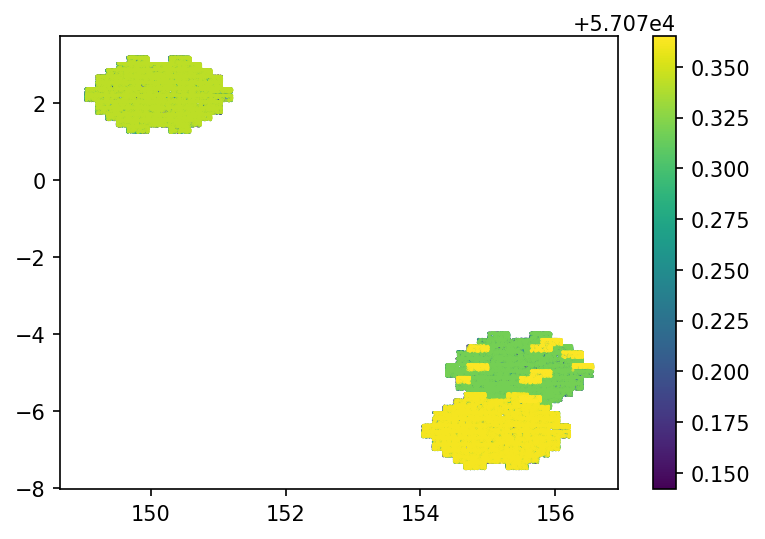

In [28]:
plt.figure(dpi=150)
plt.scatter(dia.ra,dia.decl, c=dia.midPointTai, s=0.1)
plt.colorbar()
plt.show()

## Investigate first exposure


In [29]:
grp=dia.groupby('midPointTai')

In [30]:
t0= np.fromiter(grp.groups.keys(),dtype='float')[0]


In [31]:
t0

57070.141865742786

In [32]:
diat0=dia[dia['midPointTai']==t0]

In [33]:
diat0

,diaSourceId,ccdVisitId,diaObjectId,ssObjectId,parentDiaSourceId,prv_procOrder,ssObjectReassocTime,midPointTai,ra,raErr,...,ixyPSF,extendedness,spuriousness,flags,pixelId,filterName,filterId,isDipole,bboxSize,VisitId
0,176486781787570510,41091531,176486781787570510,0,0,0,None,57070.141866,150.903971,None,...,-0.539814,None,None,25299404,0,g,1,0,46,410915
1,176486781787570511,41091531,176486781787570511,0,0,0,None,57070.141866,150.905678,None,...,-0.539814,None,None,25168332,0,g,1,0,77,410915
2,176486781787570512,41091531,176486781787570512,0,0,0,None,57070.141866,151.174007,None,...,-0.539814,None,None,25299420,0,g,1,0,7543,410915
3,176486781787570513,41091531,176486781787570513,0,0,0,None,57070.141866,150.903866,None,...,-0.539814,None,None,159517132,0,g,1,0,21,410915
4,176486781787570514,41091531,176486781787570514,0,0,0,None,57070.141866,150.903950,None,...,-0.539814,None,None,25299404,0,g,1,0,16,410915
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8637,176486859096982323,41091549,176486859096982323,0,0,0,None,57070.141866,150.500077,None,...,-0.214393,None,None,2556,0,g,1,1,6413,410915
8638,176486859096982324,41091549,176486859096982324,0,0,0,None,57070.141866,150.729159,None,...,-0.214393,None,None,25168328,0,g,1,0,17,410915
8639,176486859096982325,41091549,176486859096982325,0,0,0,None,57070.141866,150.730954,None,...,-0.214393,None,None,25168328,0,g,1,0,28,410915
8640,176486859096982326,41091549,176486859096982326,0,0,0,None,57070.141866,150.732262,None,...,-0.214393,None,None,25168000,0,g,1,1,25,410915


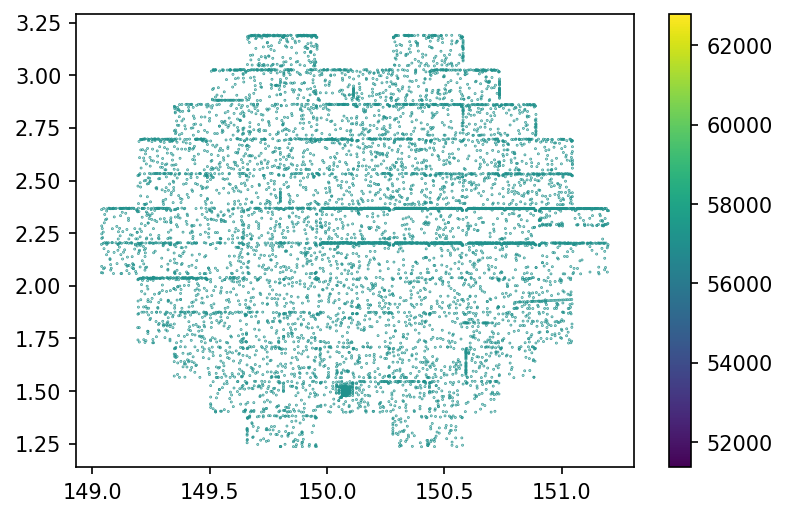

In [34]:
plt.figure(dpi=150)
plt.scatter(diat0.ra,diat0.decl, c=diat0.midPointTai, s=0.1)
plt.colorbar()
plt.show()

# Estimate FOV radius

In [35]:
rRA=0.5*(diat0.ra.max()-diat0.ra.min())

In [36]:
rDEC=0.5*(diat0.decl.max()-diat0.decl.min())

In [37]:
print(rRA,rDEC)

1.0802460753582608 0.977749812198376


In [38]:
rFOV=max(rRA,rDEC)*1.05

In [39]:
rFOV

1.1342583791261738

Collect visits contained in the DIA source dataframe

In [40]:
visits=pd.read_csv('hits_visit_df.csv')

In [41]:
visits.ra

0       09:13:31.152
1       09:13:31.152
2       09:08:53.952
3       09:13:30.840
4       09:08:53.952
            ...     
1562    10:36:39.840
1563    10:41:31.200
1564    10:36:40.217
1565    10:31:47.285
1566    10:36:35.527
Name: ra, Length: 1567, dtype: object

In [42]:
visits.dec

0       -06:18:04.68
1       -06:18:04.68
2       -04:18:02.81
3       -02:17:49.30
4       -00:17:59.06
            ...     
1562    +01:51:36.22
1563    +00:00:00.00
1564    -02:05:44.81
1565    -04:11:29.62
1566    -06:17:14.42
Name: dec, Length: 1567, dtype: object

In [43]:
c = SkyCoord(visits.ra,visits.dec, unit=(u.hourangle, u.deg), frame='icrs')

In [44]:
visits['RA']=c.ra.deg

In [45]:
visits['DEC']=c.dec.deg

In [46]:
visits

,Unnamed: 0,visit_num,tract_id,filter,field_name,image_mjd,field,ra,dec,RA,DEC
0,0,406285,12,r,Blind15A_01,57057.163410,1,09:13:31.152,-06:18:04.68,138.379800,-6.301300
1,1,406287,12,r,Blind15A_01,57057.166057,1,09:13:31.152,-06:18:04.68,138.379800,-6.301300
2,2,406288,13,r,Blind15A_02,57057.167334,2,09:08:53.952,-04:18:02.81,137.224800,-4.300781
3,3,406289,14,r,Blind15A_03,57057.168609,3,09:13:30.840,-02:17:49.30,138.378500,-2.297028
4,4,406290,15,r,Blind15A_04,57057.169878,4,09:08:53.952,-00:17:59.06,137.224800,-0.299739
...,...,...,...,...,...,...,...,...,...,...,...
1562,1562,421610,49,g,Blind15A_46,57095.197570,46,10:36:39.840,+01:51:36.22,159.166000,1.860061
1563,1563,421611,49,g,Blind15A_47,57095.198901,47,10:41:31.200,+00:00:00.00,160.380000,0.000000
1564,1564,421612,54,g,Blind15A_48,57095.200235,48,10:36:40.217,-02:05:44.81,159.167571,-2.095781
1565,1565,421613,55,g,Blind15A_49,57095.201573,49,10:31:47.285,-04:11:29.62,157.947021,-4.191561


In [47]:
pointingt0=visits[visits['visit_num'].isin(diat0.VisitId.values)]

In [48]:
pointingt0

,Unnamed: 0,visit_num,tract_id,filter,field_name,image_mjd,field,ra,dec,RA,DEC
101,101,410915,33,g,Blind15A_26,57070.140676,26,10:00:28.800,+02:12:36.00,150.12,2.21


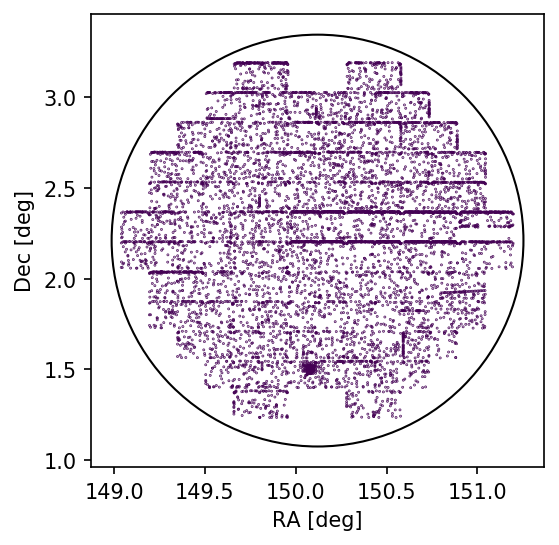

In [49]:
plotFOVt0(pointingt0,diat0,rFOV)

# Generate pointings data base to be used with ObjectsInField

In [50]:
allPointings=visits[visits['visit_num'].isin(dia.VisitId.values)].drop(columns=['ra', 'dec','Unnamed: 0'])

In [51]:
allPointings

,visit_num,tract_id,filter,field_name,image_mjd,field,RA,DEC
101,410915,33,g,Blind15A_26,57070.140676,26,150.12,2.21
115,410929,50,g,Blind15A_40,57070.159389,40,155.12,-6.52
117,410931,52,g,Blind15A_42,57070.162074,42,155.47,-4.95
154,410971,33,g,Blind15A_26,57070.226286,26,150.12,2.21
168,410985,50,g,Blind15A_40,57070.245294,40,155.12,-6.52
170,410987,52,g,Blind15A_42,57070.248004,42,155.47,-4.95
204,411021,33,g,Blind15A_26,57070.294917,26,150.12,2.21
218,411035,50,g,Blind15A_40,57070.314161,40,155.12,-6.52
220,411037,52,g,Blind15A_42,57070.316934,42,155.47,-4.95
238,411055,33,g,Blind15A_26,57070.341931,26,150.12,2.21


Figure out sample database for ObjectsInField sim

In [39]:
survey_db = sqlite3.connect("objectsInField/test/sample-kraken_2026.db")

In [40]:
cur2=survey_db.cursor()
cur2.execute("SELECT name FROM sqlite_master WHERE type='table';")
tables = cur2.fetchall()

In [41]:
tables

[('ObsHistory',)]

In [42]:
ssdb=pd.read_sql_query("SELECT * FROM ObsHistory;", survey_db)

In [43]:
ssdb

,observationId,Session_sessionId,observationStartMJD,ra,dec,angle
0,1,2026,59853.016794,305.088793,-24.889283,180.786087
1,2,2026,59853.018021,304.770694,35.966846,181.134222
2,3,2026,59853.020185,305.482200,-62.802603,2.130924
3,4,2026,59853.020637,307.103419,-60.072224,359.434908
4,5,2026,59853.021088,308.429608,-57.316612,356.831033
...,...,...,...,...,...,...
5653,2436000,2026,63496.071759,348.974476,0.674387,226.578296
5654,2436500,2026,63499.093981,0.000000,-45.524505,234.330181
5655,2437000,2026,63500.036644,342.044751,-30.452707,252.372161
5656,2437500,2026,63500.273032,53.009145,-27.438943,233.168648


In [44]:
allPointings['angle']=0

In [45]:
allPointings.reset_index(drop=True, inplace=True)

In [46]:
allPointings.rename(columns={'visit_num':'observationId' ,'image_mjd':'observationStartMJD', 'RA':'ra','DEC':'dec'}, inplace=True)

In [332]:
from sqlalchemy import create_engine
engine = create_engine('sqlite:///HiTS_2015.db', echo=False)

In [333]:
allPointings.to_sql('ObsHistory',con=engine)

In [329]:
rFOV

1.1342583791261738

In [330]:
len(allPointings.index)

12

In [52]:
test_db = sqlite3.connect("objectsInField/test2/HiTS_2015.db")

In [53]:
cur3=test_db.cursor()
cur3.execute("SELECT name FROM sqlite_master WHERE type='table';")
tables = cur3.fetchall()

In [54]:
tables

[('ObsHistory',)]

transform MPCORB file to format the survey simulator understands

In [55]:
mpcorb_col_numbers=[(0,7),(8,13),(14,19),(20,25),(26,35),(37,46),
                (48,57),(59,68),(70,79),(80,91),(92,103),(106,116),
                (117,122),(123,126),(127,136),(137,141),
                (142, 145),(146,149),(150,160),(166,194),(194,202)]

In [56]:
"Des'n     H     G   Epoch     M        Peri.      Node       Incl.       e            n           a        Reference #Obs #Opp    Arc    rms  Perts   Computer"

"Des'n     H     G   Epoch     M        Peri.      Node       Incl.       e            n           a        Reference #Obs #Opp    Arc    rms  Perts   Computer"

In [57]:
col_names=['ObjID','H','G','epoch','M','argperi','node','i','e','n','a','reference',
             'N_Obs', 'N_Opp', 'yr_1st&last_Obs', 'r.m.s',
             'coarsePerts', 'precisePerts', 'computer',
             'readableName', 'lastObs']
dtp=[str,float,float,str,float,float,float,float,float,float,float]
dtypes=dict(zip(col_names,dtp))

In [58]:
dtypes

{'ObjID': str,
 'H': float,
 'G': float,
 'epoch': str,
 'M': float,
 'argperi': float,
 'node': float,
 'i': float,
 'e': float,
 'n': float,
 'a': float}

In [59]:
mpcorb=pd.read_fwf('MPCORB.DAT',skiprows=43,colspecs=mpcorb_col_numbers,names=col_names,dytpe=dtypes,index_col=False)

In [60]:
mpcorb

,ObjID,H,G,epoch,M,argperi,node,i,e,n,...,reference,N_Obs,N_Opp,yr_1st&last_Obs,r.m.s,coarsePerts,precisePerts,computer,readableName,lastObs
0,00001,3.4,0.15,K205V,162.68631,73.73161,80.28698,10.58862,0.077557,0.214060,...,MPO492748,6751.0,115.0,1801-2019,0.60,M-v,30h,Williams,(1) Ceres,20190915.0
1,00002,4.2,0.15,K205V,144.97567,310.20237,173.02474,34.83293,0.229972,0.213345,...,MPO530953,8031.0,109.0,1821-2019,0.58,M-v,28h,MPCW,(2) Pallas,20190812.0
2,00003,5.2,0.15,K205V,125.43538,248.06618,169.85146,12.99105,0.256936,0.226129,...,MPO530953,7023.0,106.0,1821-2020,0.59,M-v,38h,MPCW,(3) Juno,20200204.0
3,00004,3.0,0.15,K205V,204.32771,150.87484,103.80908,7.14190,0.088516,0.271507,...,MPO530953,6964.0,102.0,1821-2020,0.60,M-p,18h,MPCW,(4) Vesta,20200203.0
4,00005,6.9,0.15,K205V,17.84635,358.64840,141.57102,5.36742,0.190913,0.238661,...,MPO530953,2799.0,77.0,1845-2020,0.53,M-v,38h,MPCW,(5) Astraea,20200201.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
959457,PLS4717,16.8,0.15,J609N,6.34474,348.97247,3.97611,4.42645,0.228200,0.199886,...,Icarus 59,10.0,1.0,4 days,NaN,NaN,NaN,Herget,4717 P-L,19600928.0
959458,PLS4847,17.4,0.15,J609N,359.83375,350.08779,14.72089,6.93616,0.241800,0.236911,...,Icarus 59,7.0,1.0,4 days,NaN,NaN,NaN,Herget,4847 P-L,19600928.0
959459,PLS6013,17.1,0.15,J609N,341.27760,195.31462,194.23889,5.97604,0.185815,0.286340,...,MPO157547,6.0,1.0,4 days,0.59,NaN,NaN,MPCW,6013 P-L,19600928.0
959460,T2S2060,18.1,0.15,J739F,351.03715,198.04175,176.47369,0.72943,0.202185,0.270173,...,MPC 14914,6.0,1.0,5 days,NaN,NaN,NaN,Green,2060 T-2,19731004.0


In [61]:
mpcorb.dropna(subset=['a', 'e','i','node','argperi','M','epoch'],inplace=True)

In [62]:
mpcorb['q']=mpcorb['a'].values*(1.-mpcorb['e']).values

In [63]:
mpcorb['FORMAT']='COM'

In [64]:
strs=mpcorb['epoch'].values.astype(str)

In [65]:
strs[0]

'K205V'

In [66]:
t0=unpack_mpc_date('K205V')

In [67]:
t0

59000.0

In [68]:
t0iso=Time(t0,format='mjd')

In [69]:
t0iso.iso

'2020-05-31 00:00:00.000'

In [70]:
unpack_mpc_date(mpcorb['epoch'].values[0])

59000.0

In [71]:
# for t in mpcorb['epoch'].values.astype(str):
#     unpack_mpc_date(t)

In [72]:
# t0=[unpack_mpc_date(t) for t in mpcorb['epoch'].values]

In [73]:
from tqdm import tqdm

In [74]:
tqdm.pandas()

/epyc/projects/pytrax_play/envs/pytrax_s/lib/python3.7/site-packages/tqdm/std.py:658: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [75]:
mpcorb2=mpcorb.progress_apply(convertMPCEpoch,axis=1)

100%|██████████| 959460/959460 [04:12<00:00, 3806.95it/s]


In [76]:
mpcorb2

,ObjID,H,G,epoch,M,argperi,node,i,e,n,...,N_Opp,yr_1st&last_Obs,r.m.s,coarsePerts,precisePerts,computer,readableName,lastObs,q,FORMAT
0,00001,3.4,0.15,59000.0,162.68631,73.73161,80.28698,10.58862,0.077557,0.214060,...,115.0,1801-2019,0.60,M-v,30h,Williams,(1) Ceres,20190915.0,2.553005,COM
1,00002,4.2,0.15,59000.0,144.97567,310.20237,173.02474,34.83293,0.229972,0.213345,...,109.0,1821-2019,0.58,M-v,28h,MPCW,(2) Pallas,20190812.0,2.135935,COM
2,00003,5.2,0.15,59000.0,125.43538,248.06618,169.85146,12.99105,0.256936,0.226129,...,106.0,1821-2020,0.59,M-v,38h,MPCW,(3) Juno,20200204.0,1.982706,COM
3,00004,3.0,0.15,59000.0,204.32771,150.87484,103.80908,7.14190,0.088516,0.271507,...,102.0,1821-2020,0.60,M-p,18h,MPCW,(4) Vesta,20200203.0,2.152939,COM
4,00005,6.9,0.15,59000.0,17.84635,358.64840,141.57102,5.36742,0.190913,0.238661,...,77.0,1845-2020,0.53,M-v,38h,MPCW,(5) Astraea,20200201.0,2.082619,COM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
959457,PLS4717,16.8,0.15,37200.0,6.34474,348.97247,3.97611,4.42645,0.228200,0.199886,...,1.0,4 days,NaN,NaN,NaN,Herget,4717 P-L,19600928.0,2.235905,COM
959458,PLS4847,17.4,0.15,37200.0,359.83375,350.08779,14.72089,6.93616,0.241800,0.236911,...,1.0,4 days,NaN,NaN,NaN,Herget,4847 P-L,19600928.0,1.961236,COM
959459,PLS6013,17.1,0.15,37200.0,341.27760,195.31462,194.23889,5.97604,0.185815,0.286340,...,1.0,4 days,0.59,NaN,NaN,MPCW,6013 P-L,19600928.0,1.856114,COM
959460,T2S2060,18.1,0.15,41940.0,351.03715,198.04175,176.47369,0.72943,0.202185,0.270173,...,1.0,5 days,NaN,NaN,NaN,Green,2060 T-2,19731004.0,1.890646,COM


In [77]:
#mpcorb2['t_p']=np.divide((mpcorb2['n'].values*mpcorb2['epoch'].values-np.deg2rad(mpcorb2['M'].values)),mpcorb2['n'].values)

In [78]:
mpcorb2['t_p']=mpcorb2['epoch'].values-np.divide(mpcorb2['M'].values,mpcorb2['n'].values)

In [79]:
mpcorb2['P']=360/mpcorb2['n'].values

In [80]:
mpcorb2.rename(columns={'epoch':'t_0'},inplace=True)

In [81]:
mpcorb3=mpcorb2[['ObjID','FORMAT', 'q', 'e', 'i','node', 'argperi', 't_p', 'H', 't_0']]

In [82]:
mpcorb3

,ObjID,FORMAT,q,e,i,node,argperi,t_p,H,t_0
0,00001,COM,2.553005,0.077557,10.58862,80.28698,73.73161,58239.997003,3.4,59000.0
1,00002,COM,2.135935,0.229972,34.83293,173.02474,310.20237,58320.462371,4.2,59000.0
2,00003,COM,1.982706,0.256936,12.99105,169.85146,248.06618,58445.292059,5.2,59000.0
3,00004,COM,2.152939,0.088516,7.14190,103.80908,150.87484,58247.429961,3.0,59000.0
4,00005,COM,2.082619,0.190913,5.36742,141.57102,358.64840,58925.223075,6.9,59000.0
...,...,...,...,...,...,...,...,...,...,...
959457,PLS4717,COM,2.235905,0.228200,4.42645,3.97611,348.97247,37168.258131,16.8,37200.0
959458,PLS4847,COM,1.961236,0.241800,6.93616,14.72089,350.08779,35681.142929,17.4,37200.0
959459,PLS6013,COM,1.856114,0.185815,5.97604,194.23889,195.31462,36008.137411,17.1,37200.0
959460,T2S2060,COM,1.890646,0.202185,0.72943,176.47369,198.04175,40640.695887,18.1,41940.0


In [83]:
mpcorbArray=np.array_split(mpcorb3,10)

In [84]:
mpcorbArray

[       ObjID FORMAT         q         e         i       node    argperi  \
 0      00001    COM  2.553005  0.077557  10.58862   80.28698   73.73161   
 1      00002    COM  2.135935  0.229972  34.83293  173.02474  310.20237   
 2      00003    COM  1.982706  0.256936  12.99105  169.85146  248.06618   
 3      00004    COM  2.152939  0.088516   7.14190  103.80908  150.87484   
 4      00005    COM  2.082619  0.190913   5.36742  141.57102  358.64840   
 ...      ...    ...       ...       ...       ...        ...        ...   
 95941  95942    COM  2.304392  0.289744   0.94987  344.89011  305.38704   
 95942  95943    COM  2.277135  0.271572   1.50874   59.97068  291.93332   
 95943  95944    COM  2.245178  0.289619  23.64581  291.14062  286.80764   
 95944  95945    COM  2.421291  0.229459  12.75260  266.44272  113.70414   
 95945  95946    COM  2.615852  0.173158  27.03598  163.89883  147.43521   
 
                 t_p     H      t_0  
 0      58239.997003   3.4  59000.0  
 1      58

In [71]:
for i in range(len(mpcorbArray)):
    mpcorbArray[i].to_csv('objectsInField/test3/mpcorb_'+str(i)+'.ssm', sep=' ', index=False)

mpcorb

In [85]:
t0=Time(37200.0,format='mjd')

In [86]:
t0.iso

'1960-09-23 00:00:00.000'

Get ObjectInFields results after oif runs

In [87]:
ephem=pd.read_csv('objectsInField/test3/results/oif_all.dat',sep='\s+', header=0)

In [88]:
ephem

,ObjID,FieldID,FieldMJD,AstRange(km),AstRangeRate(km/s),AstRA(deg),AstRARate(deg/day),AstDec(deg),AstDecRate(deg/day),Ast-Sun(J2000x)(km),Ast-Sun(J2000y)(km),Ast-Sun(J2000z)(km),Sun-Ast-Obs(deg),V,V(H=0)
0,52,410915,57070.140676,2.011442e+08,3.684,149.478390,-0.268083,2.737971,0.083165,-2.983248e+08,1.740618e+08,4.082694e+07,4.011733,21.642,2.842
1,52,410971,57070.226286,2.011723e+08,3.937,149.455393,-0.268700,2.745086,0.083061,-2.984294e+08,1.739705e+08,4.077860e+07,3.999025,21.641,2.841
2,52,411021,57070.294917,2.011963e+08,4.132,149.436995,-0.267155,2.750784,0.082987,-2.985132e+08,1.738972e+08,4.073984e+07,3.989219,21.641,2.841
3,52,411055,57070.341931,2.012133e+08,4.244,149.424478,-0.265179,2.754685,0.082961,-2.985706e+08,1.738470e+08,4.071329e+07,3.982691,21.641,2.841
4,70,410915,57070.140676,2.036316e+08,2.338,149.124291,-0.268000,1.791802,0.078338,-2.999375e+08,1.764728e+08,3.758570e+07,4.391084,21.603,2.903
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
845,95890,410987,57070.248004,3.012965e+08,-6.539,155.150209,-0.215967,-5.872980,0.077572,-3.973678e+08,1.977583e+08,2.953163e+05,6.125277,20.459,4.359
846,95890,411035,57070.314161,3.012597e+08,-6.353,155.135946,-0.215034,-5.867833,0.078031,-3.973988e+08,1.976763e+08,2.682627e+05,6.110304,20.458,4.358
847,95890,411037,57070.316934,3.012582e+08,-6.345,155.135350,-0.214973,-5.867616,0.078049,-3.974001e+08,1.976728e+08,2.671286e+05,6.109678,20.458,4.358
848,95890,411069,57070.361126,3.012342e+08,-6.242,155.125875,-0.213779,-5.864161,0.078319,-3.974207e+08,1.976180e+08,2.490571e+05,6.099721,20.457,4.357


In [89]:
ephemt0 = ephem[ephem['FieldMJD']==ephem['FieldMJD'].min()].reset_index(drop=True)

In [90]:
ephemt0

,ObjID,FieldID,FieldMJD,AstRange(km),AstRangeRate(km/s),AstRA(deg),AstRARate(deg/day),AstDec(deg),AstDecRate(deg/day),Ast-Sun(J2000x)(km),Ast-Sun(J2000y)(km),Ast-Sun(J2000z)(km),Sun-Ast-Obs(deg),V,V(H=0)
0,52,410915,57070.140676,2.011442e+08,3.684,149.478390,-0.268083,2.737971,0.083165,-2.983248e+08,1.740618e+08,4.082694e+07,4.011733,21.642,2.842
1,70,410915,57070.140676,2.036316e+08,2.338,149.124291,-0.268000,1.791802,0.078338,-2.999375e+08,1.764728e+08,3.758570e+07,4.391084,21.603,2.903
2,212,410915,57070.140676,3.459774e+08,-1.364,150.472915,-0.203164,2.358518,0.100100,-4.260372e+08,2.423900e+08,4.545636e+07,2.941827,21.309,4.709
3,1755,410915,57070.140676,2.434482e+08,-5.234,150.914331,-0.205485,2.511863,0.089930,-3.377929e+08,1.902553e+08,4.188802e+07,3.667329,17.985,3.485
4,4073,410915,57070.140676,3.079634e+08,-2.538,149.761841,-0.193895,2.499584,0.103437,-3.910581e+08,2.269661e+08,4.464955e+07,3.141888,16.695,4.295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,92606,410915,57070.140676,3.305104e+08,-2.130,149.561075,-0.231508,1.809174,0.034498,-4.100634e+08,2.393843e+08,4.165308e+07,3.208334,20.557,4.557
91,92695,410915,57070.140676,1.759238e+08,-3.876,149.443549,-0.224507,1.623492,0.141241,-2.766817e+08,1.614262e+08,3.620279e+07,4.833555,19.731,2.431
92,92832,410915,57070.140676,3.061764e+08,-2.536,150.223782,-0.195263,1.969817,0.088910,-3.908448e+08,2.239862e+08,4.174281e+07,3.324537,20.484,4.284
93,93025,410915,57070.140676,2.939678e+08,0.065,149.842142,-0.243214,1.860060,0.044039,-3.792931e+08,2.196316e+08,4.076035e+07,3.454073,21.344,4.144


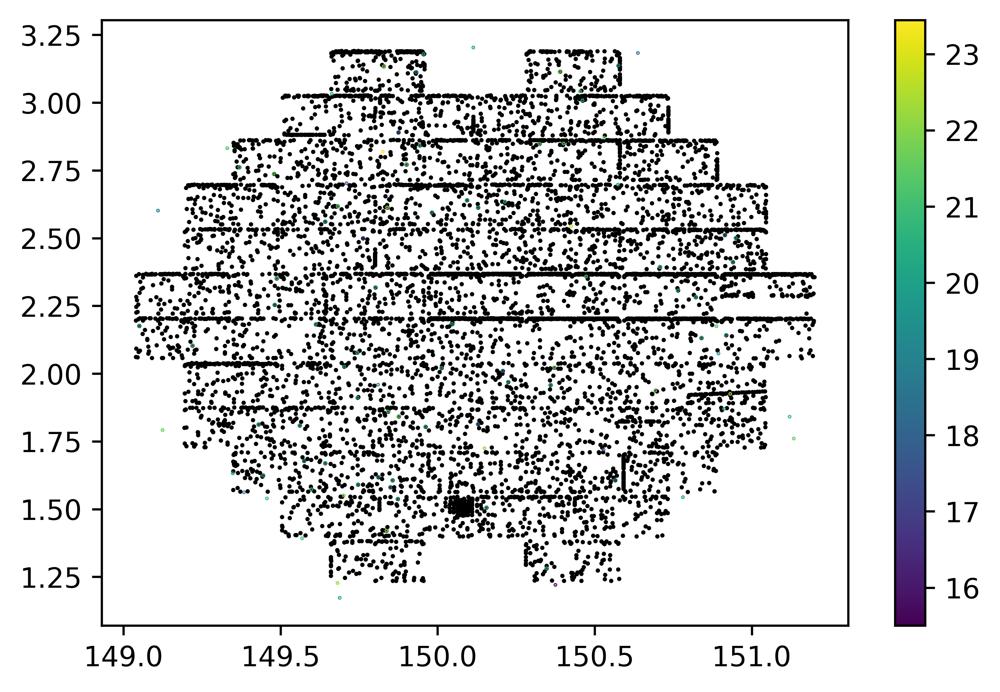

In [91]:
plt.figure(dpi=600)
plt.scatter(diat0.ra,diat0.decl, s=0.3, c='k')
plt.scatter(ephemt0['AstRA(deg)'],ephemt0['AstDec(deg)'], s=0.1, c=ephemt0['V'])
plt.colorbar()
plt.show()

In [94]:
from sklearn.metrics.pairwise import haversine_distances

In [372]:
def greatCircleDistance(lat1,lon1,lat2,lon2, deg=False):
    
    sin = np.sin
    cos = np.cos
    arcsin = np.arcsin
    sqrt = np.sqrt
    
    if (deg):
        deg2rad=np.deg2rad
        
        lat1=deg2rad(lat1)
        lat2=deg2rad(lat2)
        lon1=deg2rad(lon1)
        lon2=deg2rad(lon2)
        
    a2 = sin(0.5*(lat1-lat2))**2
    b2 = cos(lat1)*cos(lat2)*sin(0.5*(lon1-lon2))**2

    d=2*arcsin(sqrt(a2+b2))
    
    if (deg):
        d=np.rad2deg(d)
    
    return d
    

In [382]:
def associateDIA2SSO(diadf,ssodf,rOnSky=2,diara='ra',diadec='decl',ssora='AstRA(deg)',ssodec='AstDec(deg)',
                    diaId='diaSourceId',ssoId='ObjID',dId='dOnSky(arcsec)',metric='euclidean'):
    """
    Match DIA sources within rOnSky [arcsec] to Solar System Object (SSO) predicted positions.
    
    Parameters:
    -----------
    diadf  ...      pandas DataFrame containing DIA source RADEC coordinates[deg]
    ssodf  ...      pandas DataFrame containing predicted SSO RADEC coordinates [deg]
    rOnSky ...      radius of kdTree search for nearest DIA neighbors to SSOs in FOV [arcsec]
    metric ...      'euclidean', 'great_circle': distance metric between DIA source and SSO
    
    Returns:
    --------
    dia2ssodf   ... pandas DataFrame with DIA sources that have SSOs attributed to them 
                    (one SSO may have multiple dia sources in its vicinity)
    sso2dia     ... list of SSOs with attributed DIA sources
    
    
    External:
    ---------
    
    numpy, scipy: cKDTree
    
    """


    deg2rad = np.deg2rad
    rad2deg = np.rad2deg
    array = np.array
    where = np.where
    full = np.full
    norm = np.linalg.norm
    
    r=deg2rad(rOnSky/3600)
    
    # Transform DIA RADEC coordinates to unit sphere xyz for tree building.
    diaSourcesX = radec2icrfu(diadf[diara].values,diadf[diadec].values).T
    diaSourceRArad = deg2rad(diadf[diara].values)
    diaSourceDecrad = deg2rad(diadf[diadec].values)
    
    # Create KDTree of DIA sources
    tree = cKDTree(diaSourcesX,balanced_tree=True)
    
    treeQuery = tree.query_ball_point
    
    diaSourcesId = diadf[diaId].values
    
    sso2dia =[]
    sso2diaAdd = sso2dia.append
    
    diaSsoId=[]
    diaSsoIdAdd=diaSsoId.append
    
    # Query the KDtree for DIA nearest neighbors to SSOs
    for index, row in ssodf.iterrows():

        # convert SSO radec to ICRF position
        ssox = radec2icrfu(row[ssora],row[ssodec])
        
        # Which DIA Sources fall within r? 
        idx = treeQuery(ssox, r, p=2., eps=0)
        
        if(len(idx)>0):
            # calculate approximate on sky distance d [rad]
            ssorad = deg2rad([row[ssodec],row[ssora]]) 
            
            if (metric=='euclidean'):
                d = 3600.*rad2deg([norm(ssox-diaSourcesX[i]) for i in idx])
            
            else:
                d = 3600.*rad2deg([greatCircleDistance(deg2rad(row[ssodec]),deg2rad(row[ssora]),
                                                diaSourceDecrad[i],diaSourceRArad[i])
                                                for i in idx])
        
            
            sso2diaAdd([row[ssoId].astype(int), diaSourcesId[idx],d])
            diaSsoIdAdd(array([diaSourcesId[idx],full(len(idx),row[ssoId].astype(int)),d]).T)
        
    dia2ssodf=pd.DataFrame(np.concatenate(diaSsoId),columns=[diaId,ssoId,dId]).astype({diaId:int,ssoId:int,dId:float})

    return dia2ssodf,sso2dia
    

In [383]:
[diasso,ssoN] =associateDIA2SSO(diat0,ephemt0,rOnSky=10)

In [361]:
def associateDIA2SSO2(diadf,ssodf,rOnSky=2,diara='ra',diadec='decl',ssora='AstRA(deg)',ssodec='AstDec(deg)',
                    diaId='diaSourceId',ssoId='ObjID',dId='dOnSky(arcsec)'):
    """
    Match DIA sources within rOnSky [arcsec] to Solar System Object predicted positions.
    
    Parameters:
    -----------
    diadf  ...      pandas DataFrame containing DIA source RADEC coordinates[deg]
    ssodf  ...      pandas DataFrame containing predicted SSO RADEC coordinates [deg]
    rOnSky ...      radius of kdTree search for nearest DIA neighbors to SSOs in FOV [arcsec]
    
    
    Returns:
    --------
    dia2ssodf   ... pandas DataFrame with DIA sources that have SSOs attributed to them 
                    (one SSO may have multiple dia sources in its vicinity)
    sso2dia     ... list of SSOs with attributed DIA sources
    
    
    External:
    ---------
    
    numpy, scipy: cKDTree
    
    """

    deg2rad = np.deg2rad
    rad2deg = np.rad2deg
    array = np.array
    where = np.where
    full = np.full
    norm = np.linalg.norm
    
    r=deg2rad(rOnSky/3600)
    
    # Transform DIA RADEC coordinates to unit sphere xyz for tree building.
    #diaSourcesX = radec2icrfu(diadf[diara].values,diadf[diadec].values).T
    diaSourcesX=deg2rad(array([diadf[diara].values,diadf[diadec].values]).T)

    # Create KDTree of DIA sources
    #tree = BallTree(diaSourcesX,metric=haversine_distances)
    tree = BallTree(diaSourcesX,metric='haversine')
    
    #treeQuery = tree.query_ball_point
    treeQuery = tree.query_radius
    
    diaSourcesId = diadf[diaId].values
    
    sso2dia =[]
    sso2diaAdd = sso2dia.append
    
    diaSsoId=[]
    diaSsoIdAdd=diaSsoId.append
    
#     # Query the KDtree for DIA nearest neighbors to SSOs
#     for index, row in ssodf.iterrows():

#         # convert SSO radec to ICRF position
#         #x = radec2icrfu(row[ssora],row[ssodec])
#         x = array([row[ssora],row[ssodec]])
        
#         print(x)
#         # Which DIA Sources fall within r? 
#         idx, d = treeQuery(x, r=r, return_distance=True, sort_results=True)
        
#         # calculate approximate on sky distance d [rad]
#         #d=3600.*rad2deg([norm(x-diaSourcesX[i]) for i in idx])
        
#         if(len(idx)>0):
#             sso2diaAdd([row[ssoId].astype(int), diaSourcesId[idx],d])
#             diaSsoIdAdd(array([diaSourcesId[idx],full(len(idx),row[ssoId].astype(int)),d]).T)
    #print(ssodf[[ssora, ssodec]].values)
    ssox=deg2rad(ssodf[[ssora,ssodec]].values)
    
    idx, d = treeQuery(ssox, r=r, return_distance=True, sort_results=True)
 
    print(idx,d*3600)
    print(ssodf[ssoId].values.astype(int))
    sso2dia=[ssodf[ssoId].values.astype(int), diaSourcesId[idx], d*3600]
    
 
    #dia2ssodf=pd.DataFrame(np.concatenate(diaSsoId),columns=[diaId,ssoId,dId]).astype({diaId:int,ssoId:int,dId:float})

    return dia2ssodf,sso2dia

In [324]:
def plotSSOinFOV(ssodf, diadf, title='', xlabel='RA [deg]', 
                 ylabel='Dec [deg]', ssora='AstRA(deg)', 
                 ssodec='AstDec(deg)', diara='ra', diadec='decl',
                 ssoname='readableName',dpi=800):

    plt.figure(dpi=dpi)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.title(title)

    m = ['o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X']
    c = ['b', 'g', 'r', 'c', 'm', 'y', 'k']

    i=0
    for index,row in ssodf.iterrows():
        plt.scatter(row[ssora],row[ssodec], s=5, label=row[ssoname],c=c[np.mod(i,7)], marker=m[np.mod(i,15)])
        i=i+1
    plt.scatter(diadf[diara],diadf[diadec], s=0.5, c='#888888',label='DIASources', marker = MarkerStyle('.', fillstyle = 'none'))

    plt.legend(bbox_to_anchor=(1.1, 1.0),prop={'size': 2})
    plt.show()


In [274]:
ddd

NameError: name 'ddd' is not defined

In [252]:
diasso

,diaSourceId,ObjID,dOnSky(arcsec)
0,176486683003322976,52,0.269326
1,176486773197636224,212,0.379242
2,176486751722799776,1755,0.688452
3,176486734542930496,4073,0.541463
4,176486854802014880,4892,0.571479
...,...,...,...
64,176486846212080160,92606,0.421706
65,176486867686916704,92695,0.526259
66,176486829032211232,92832,0.423777
67,176486850507047616,93025,0.272773


In [243]:
[diasso2,ssoN2] =associateDIA2SSO2(diat0,ephemt0,rOnSky=10)

[[2.63377115 0.04108901]
 [2.63380094 0.03986219]
 [2.63848416 0.03878116]
 ...
 [2.63075144 0.03016912]
 [2.63077427 0.0317806 ]
 [2.63075128 0.0325662 ]]
[array([1718]) array([], dtype=int64) array([8130]) array([4104])
 array([7528]) array([776]) array([], dtype=int64) array([1167])
 array([5448]) array([], dtype=int64) array([2099]) array([1276])
 array([], dtype=int64) array([8511]) array([7585]) array([2078])
 array([], dtype=int64) array([4800]) array([2490]) array([6551])
 array([1159]) array([], dtype=int64) array([1129]) array([5668])
 array([], dtype=int64) array([8361]) array([5827]) array([], dtype=int64)
 array([4860]) array([4114]) array([], dtype=int64) array([4219])
 array([1608]) array([8434]) array([2487]) array([], dtype=int64)
 array([1481]) array([7196]) array([1681]) array([7322])
 array([4891, 4890, 4892]) array([], dtype=int64) array([2440])
 array([7313]) array([7426]) array([978]) array([], dtype=int64)
 array([722]) array([4374]) array([3230]) array([1241])


IndexError: arrays used as indices must be of integer (or boolean) type

In [236]:
len(diasso.ObjID.unique())

63

In [237]:
diasso.ObjID.values

array([   52,   212,  1755,  4073,  4892,  6967,  8341,  8777,  9700,
       10012, 13161, 14209, 17424, 17686, 23146, 23201, 25138, 25294,
       28940, 32303, 35978, 38966, 39217, 39402, 40263, 41258, 41774,
       43792, 44476, 45078, 45085, 49594, 50651, 51071, 52231, 53241,
       54949, 55243, 57128, 57603, 58498, 59315, 60197, 60605, 65579,
       71702, 74215, 76429, 77543, 78694, 79205, 79795, 80859, 81934,
       84846, 89421, 89973, 91263, 92606, 92695, 92832, 93025, 94381])

In [238]:
len(diasso.diaSourceId.unique())

52

In [154]:
diasso.diaSourceId.values

array([176486683003322976, 176486773197636224, 176486751722799776,
       176486734542930496, 176486854802014880, 176486871981884032,
       176486897751687936, 176486708773126720, 176486850507047680,
       176486661528486560, 176486670118421120, 176486708773126720,
       176486652938552000, 176486829032211264, 176486777492603456,
       176486871981884032, 176486871981884000, 176486713068094080,
       176486747427832608, 176486678708355680, 176486652938552064,
       176486751722799776, 176486760312734240, 176486914931556896,
       176486661528486496, 176486829032211264, 176486794672472832,
       176486807557374624, 176486683003322944, 176486867686916736,
       176486652938552064, 176486829032211232, 176486867686916736,
       176486841917112992, 176486811852341440, 176486837622145696,
       176486786082538112, 176486695888225024, 176486850507047648,
       176486867686916768, 176486893456720736, 176486871981884032,
       176486717363061536, 176486790377505408, 176486760312734

In [143]:
ssoN

[[52, array([176486683003322979]), array([0.26932629])],
 [212, array([176486773197636236]), array([0.37924171])],
 [1755, array([176486751722799780]), array([0.68845226])],
 [4073, array([176486734542930505]), array([0.54146345])],
 [4892, array([176486854802014882]), array([0.57147908])],
 [6967, array([176486871981884039]), array([0.85936266])],
 [8341, array([176486897751687921]), array([0.56372218])],
 [8777, array([176486708773126727]), array([0.38271447])],
 [9700, array([176486850507047671]), array([0.40987382])],
 [10012, array([176486661528486564]), array([0.59598431])],
 [13161, array([176486670118421112]), array([0.68286387])],
 [14209, array([176486708773126706]), array([0.44514211])],
 [17424, array([176486652938551989]), array([0.63316203])],
 [17686, array([176486829032211272]), array([0.8388523])],
 [23146, array([176486777492603460]), array([0.81741163])],
 [23201, array([176486871981884031]), array([0.42967255])],
 [25138, array([176486871981884001]), array([0.435835

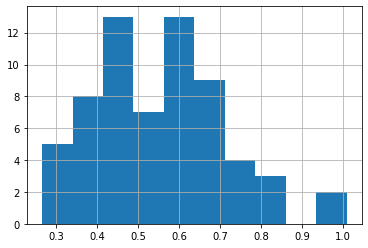

In [109]:
diasso['dOnSky(arcsec)'].hist()

In [132]:
nDIA=[]
nSSO=[]
rrange=[0.5,1,1.5,2,3,5,10,100]
for r in rrange:
    [diasso,ssoN] =associateDIA2SSO(diat0,ephemt0,rOnSky=r)
    nDIA.append(len(np.unique(diasso.diaSourceId.values)))
    nSSO.append(len(np.unique(diasso.ObjID.values)))

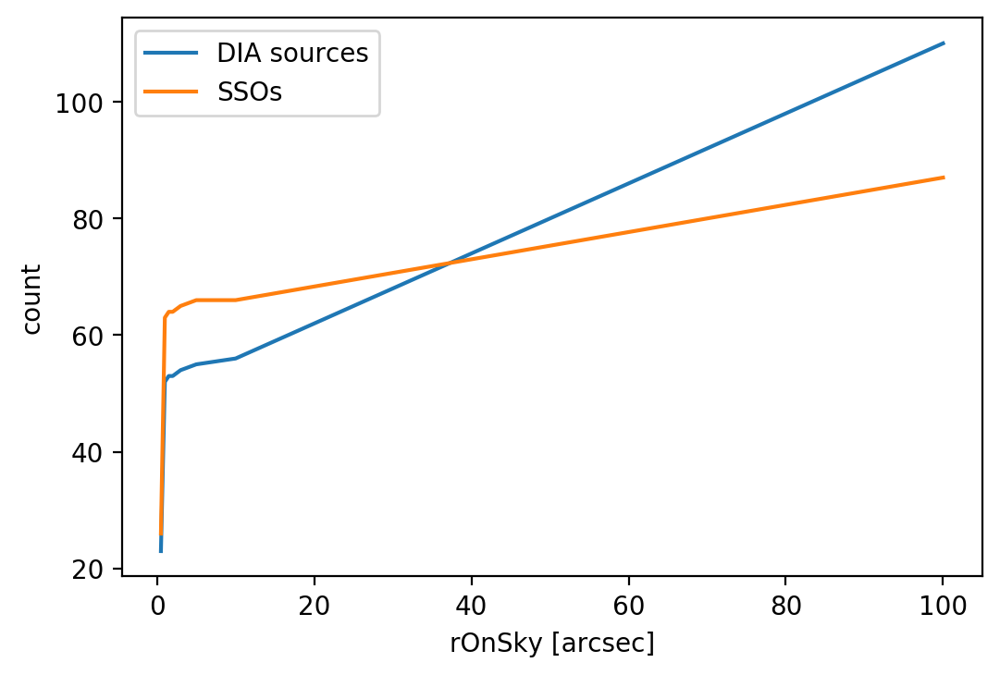

In [133]:
plt.figure(dpi=200)
plt.plot(rrange,nDIA, label='DIA sources')
plt.plot(rrange,nSSO, label='SSOs')
plt.legend()
plt.xlabel('rOnSky [arcsec]')
plt.ylabel('count')
plt.show()

In [110]:
diadf=diat0[diat0.diaSourceId.isin(diasso.diaSourceId)]

In [111]:
ssodf=ephemt0[ephemt0.ObjID.isin(diasso.ObjID)]

In [112]:
ssodf


,ObjID,FieldID,FieldMJD,AstRange(km),AstRangeRate(km/s),AstRA(deg),AstRARate(deg/day),AstDec(deg),AstDecRate(deg/day),Ast-Sun(J2000x)(km),Ast-Sun(J2000y)(km),Ast-Sun(J2000z)(km),Sun-Ast-Obs(deg),V,V(H=0)
0,52,410915,57070.140676,2.011442e+08,3.684,149.478390,-0.268083,2.737971,0.083165,-2.983248e+08,1.740618e+08,4.082694e+07,4.011733,21.642,2.842
2,212,410915,57070.140676,3.459774e+08,-1.364,150.472915,-0.203164,2.358518,0.100100,-4.260372e+08,2.423900e+08,4.545636e+07,2.941827,21.309,4.709
3,1755,410915,57070.140676,2.434482e+08,-5.234,150.914331,-0.205485,2.511863,0.089930,-3.377929e+08,1.902553e+08,4.188802e+07,3.667329,17.985,3.485
4,4073,410915,57070.140676,3.079634e+08,-2.538,149.761841,-0.193895,2.499584,0.103437,-3.910581e+08,2.269661e+08,4.464955e+07,3.141888,16.695,4.295
5,4892,410915,57070.140676,1.315971e+08,-2.222,150.128080,-0.226136,1.814118,0.115359,-2.393055e+08,1.375355e+08,3.538458e+07,5.491316,18.215,1.515
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90,92606,410915,57070.140676,3.305104e+08,-2.130,149.561075,-0.231508,1.809174,0.034498,-4.100634e+08,2.393843e+08,4.165308e+07,3.208334,20.557,4.557
91,92695,410915,57070.140676,1.759238e+08,-3.876,149.443549,-0.224507,1.623492,0.141241,-2.766817e+08,1.614262e+08,3.620279e+07,4.833555,19.731,2.431
92,92832,410915,57070.140676,3.061764e+08,-2.536,150.223782,-0.195263,1.969817,0.088910,-3.908448e+08,2.239862e+08,4.174281e+07,3.324537,20.484,4.284
93,93025,410915,57070.140676,2.939678e+08,0.065,149.842142,-0.243214,1.860060,0.044039,-3.792931e+08,2.196316e+08,4.076035e+07,3.454073,21.344,4.144


In [456]:
mpcorb.rename(columns={'objectId':'ObjID'},inplace=True)
ssoFound=ssodf.join(mpcorb, on="ObjID",rsuffix='_MPC')
outputCols=['readableName','H','a','e','V','AstRA(deg)','AstDec(deg)','AstRARate(deg/day)','AstDecRate(deg/day)']
ssoFound[outputCols]

,readableName,H,a,e,V,AstRA(deg),AstDec(deg),AstRARate(deg/day),AstDecRate(deg/day)
0,(53) Kalypso,8.9,2.618932,0.204808,21.642,149.478390,2.737971,-0.268083,0.083165
2,(213) Lilaea,8.9,2.753487,0.144717,21.309,150.472915,2.358518,-0.203164,0.100100
3,(1756) Giacobini,12.1,2.547785,0.231749,17.985,150.914331,2.511863,-0.205485,0.089930
4,(4074) Sharkov,12.4,3.023968,0.035662,16.695,149.761841,2.499584,-0.193895,0.103437
5,(4893) Seitter,12.2,3.147121,0.088562,18.215,150.128080,1.814118,-0.226136,0.115359
...,...,...,...,...,...,...,...,...,...
90,(92607) 2000 PM23,16.1,2.391678,0.210964,20.557,149.561075,1.809174,-0.231508,0.034498
91,(92696) 2000 QJ78,15.7,2.408400,0.095292,19.731,149.443549,1.623492,-0.224507,0.141241
92,(92833) 2000 QK184,15.8,2.415892,0.153837,20.484,150.223782,1.969817,-0.195263,0.088910
93,(93026) 2000 RT96,14.2,2.662314,0.225711,21.344,149.842142,1.860060,-0.243214,0.044039


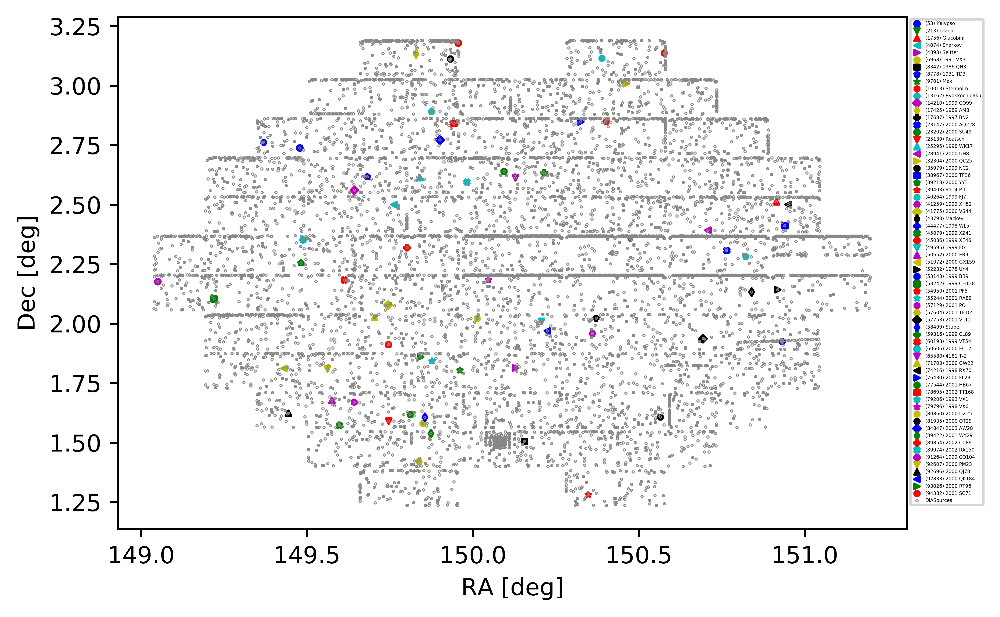

In [459]:
plotSSOinFOV(ssoFound, diat0, title='', xlabel='RA [deg]', 
                 ylabel='Dec [deg]', ssora='AstRA(deg)', 
                 ssodec='AstDec(deg)', diara='ra', diadec='decl',
                 ssoname='readableName',dpi=800)

In [168]:
# Create KDTree to select FDs in field
diaSourcesX=radec2icrfu(diat0['ra'].values,diat0['decl'].values).T

In [169]:
diaSourcesX

array([[-0.87306841,  0.48586438,  0.04107744],
       [-0.87312626,  0.48586252,  0.03985163],
       [-0.87542931,  0.48178865,  0.03877144],
       ...,
       [-0.87193658,  0.48868876,  0.03016455],
       [-0.8719042 ,  0.48864445,  0.03177525],
       [-0.87187092,  0.48865214,  0.03256045]])

In [388]:
10/3600*np.pi/180

4.84813681109536e-05

In [170]:
# Create KDTree to select FDs in field
tree=cKDTree(diaSourcesX,balanced_tree=True)

In [185]:
array=np.array

r=10/3600*np.pi/180
raName='AstRA(deg)'
decName='AstDec(deg)'

diaNeighborsRADEC=[]
for index, row in ephemt0.iterrows():

    # convert radec to ICRF unit vector
    x=radec2icrfu(row[raName],row[decName])

    # Which FDs fall into the FOV of the current visit? 
    idx=tree.query_ball_point(x, r, p=2., eps=0)

    [xi, yi, zi] = diaSourcesX[idx].T

    [ra, dec]=icrf2radec(xi,yi,zi)

    diaNeighborsRADEC.append(array([ra,dec]).T)

In [186]:
nNeighbors=[]
for i in diaNeighborsRADEC:
    nNeighbors.append(len(i))

In [187]:
len(nNeighbors)

95

In [188]:
len(ephemt0)

95

In [189]:
idxNoNeighbor=np.where(np.array(nNeighbors)==0)[0]

In [190]:
idxOneNeighbor=np.where(np.array(nNeighbors)==1)[0]

In [191]:
idxMultiNeighbor=np.where(np.array(nNeighbors)>1)[0]

In [192]:
idxMultiNeighbor

array([40, 74])

In [193]:
ephemt0NoN=ephemt0[ephemt0.index.isin(idxNoNeighbor)]

In [194]:
ephemt0OneN=ephemt0[ephemt0.index.isin(idxOneNeighbor)]

In [195]:
ephemt0MultiN=ephemt0[ephemt0.index.isin(idxMultiNeighbor)]

In [196]:
ephemt0MultiN

,ObjID,FieldID,FieldMJD,AstRange(km),AstRangeRate(km/s),AstRA(deg),AstRARate(deg/day),AstDec(deg),AstDecRate(deg/day),Ast-Sun(J2000x)(km),Ast-Sun(J2000y)(km),Ast-Sun(J2000z)(km),Sun-Ast-Obs(deg),V,V(H=0)
40,45085,410915,57070.140676,3.858823e+08,-0.965,149.955200,-0.188012,3.179287,0.065213,-4.587682e+08,2.649297e+08,5.261985e+07,2.493368,20.187,5.087
74,79795,410915,57070.140676,2.830291e+08,-2.083,150.045947,-0.214843,2.183886,0.118878,-3.702951e+08,2.132400e+08,4.200393e+07,3.430276,20.307,4.007


In [197]:
ephemt0NoN

,ObjID,FieldID,FieldMJD,AstRange(km),AstRangeRate(km/s),AstRA(deg),AstRARate(deg/day),AstDec(deg),AstDecRate(deg/day),Ast-Sun(J2000x)(km),Ast-Sun(J2000y)(km),Ast-Sun(J2000z)(km),Sun-Ast-Obs(deg),V,V(H=0)
1,70,410915,57070.140676,2.036316e+08,2.338,149.124291,-0.268000,1.791802,0.078338,-2.999375e+08,1.764728e+08,3.758570e+07,4.391084,21.603,2.903
6,5857,410915,57070.140676,1.851339e+08,-2.342,150.375025,-0.249191,1.220482,0.094995,-2.861460e+08,1.635195e+08,3.516192e+07,4.870832,15.504,2.604
9,8571,410915,57070.140676,2.234785e+08,-2.832,149.109675,-0.236926,2.601669,0.103728,-3.168302e+08,1.866395e+08,4.136276e+07,3.835902,18.795,3.195
12,9977,410915,57070.140676,2.987877e+08,-0.383,150.527950,-0.220781,1.719564,0.040161,-3.852556e+08,2.189617e+08,4.018449e+07,3.464822,17.404,4.204
16,14485,410915,57070.140676,3.718454e+08,-3.416,150.530444,-0.190869,2.870537,0.076005,-4.485783e+08,2.547286e+08,4.984039e+07,2.650796,21.359,4.959
21,24541,410915,57070.140676,2.066471e+08,-1.783,149.383162,-0.199261,1.562125,0.173136,-3.030223e+08,1.772298e+08,3.685198e+07,4.440445,18.956,2.956
24,28503,410915,57070.140676,3.228659e+08,-3.270,149.701119,-0.200530,1.550408,0.136689,-4.039115e+08,2.348544e+08,3.995420e+07,3.339520,21.879,4.479
27,32604,410915,57070.140676,2.984033e+08,-1.807,150.453319,-0.209549,3.041216,0.141911,-3.844811e+08,2.189698e+08,4.705019e+07,3.030831,21.174,4.174
30,39047,410915,57070.140676,3.849338e+08,-3.505,151.120763,-0.175886,1.841153,0.121276,-4.621387e+08,2.578383e+08,4.358601e+07,2.880710,20.801,5.101
35,41474,410915,57070.140676,1.946798e+08,-3.231,150.637680,-0.267074,3.183365,0.055607,-2.946582e+08,1.673349e+08,4.202949e+07,3.893812,18.524,2.724


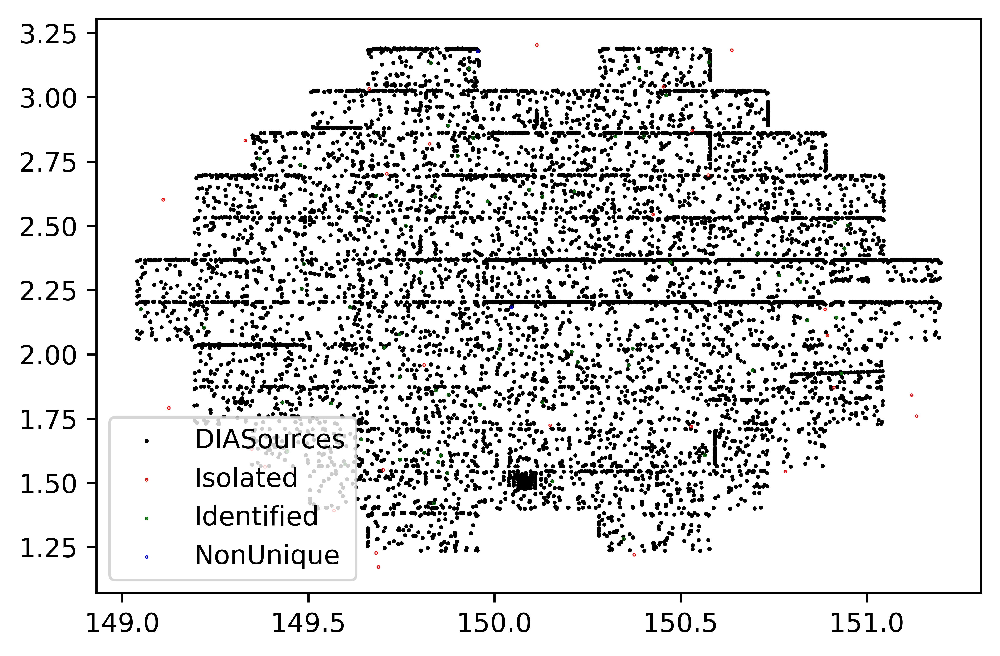

In [198]:
plt.figure(dpi=800)
plt.scatter(diat0.ra,diat0.decl, s=0.3, c='k',label='DIASources')
plt.scatter(ephemt0NoN['AstRA(deg)'],ephemt0NoN['AstDec(deg)'], s=0.1, c='r',label='Isolated')
plt.scatter(ephemt0OneN['AstRA(deg)'],ephemt0OneN['AstDec(deg)'], s=0.1, c='g',label='Identified')
plt.scatter(ephemt0MultiN['AstRA(deg)'],ephemt0MultiN['AstDec(deg)'], s=0.1, c='b',label='NonUnique')
plt.legend()
plt.show()

In [219]:
notFoundInFOV=ephemt0NoN[((((ephemt0NoN['AstRA(deg)'].values-np.median(diat0['ra']))**2+ (ephemt0NoN['AstDec(deg)'].values-np.median(diat0['decl']))**2))<0.75)]

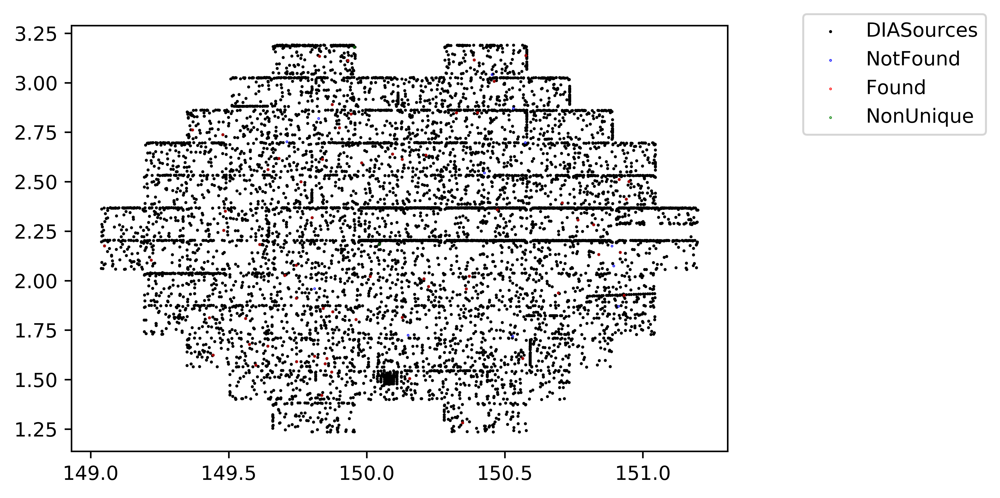

In [285]:
plt.figure(dpi=800)
plt.scatter(diat0.ra,diat0.decl, s=0.3, c='k',label='DIASources')
plt.scatter(notFoundInFOV['AstRA(deg)'],notFoundInFOV['AstDec(deg)'], s=0.1, c='b',label='NotFound')
plt.scatter(ephemt0OneN['AstRA(deg)'],ephemt0OneN['AstDec(deg)'], s=0.1, c='r',label='Found')
plt.scatter(ephemt0MultiN['AstRA(deg)'],ephemt0MultiN['AstDec(deg)'], s=0.1, c='g',label='NonUnique')
plt.legend(bbox_to_anchor=(1.1, 1.05))
plt.show()

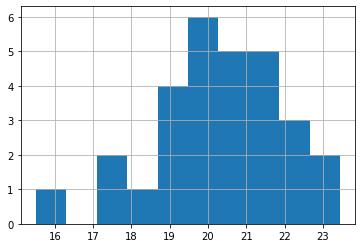

In [221]:
ephemt0NoN['V'].hist()

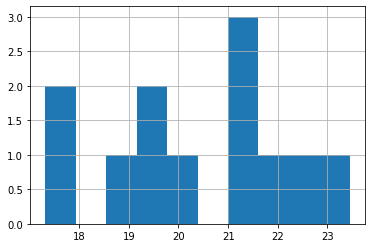

In [222]:
notFoundInFOV['V'].hist()

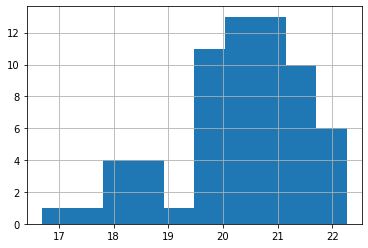

In [223]:
ephemt0OneN['V'].hist()

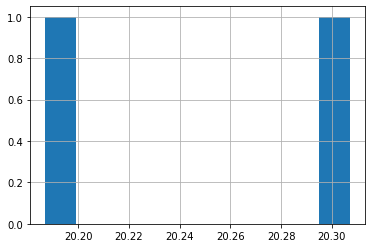

In [224]:
ephemt0MultiN['V'].hist()

In [271]:
mpcorb.rename(columns={'objectId':'ObjID'},inplace=True)

In [288]:
outputCols=['readableName','H','a','e','V','AstRA(deg)','AstDec(deg)','AstRARate(deg/day)','AstDecRate(deg/day)']

In [275]:
ssoFound=ephemt0OneN.join(mpcorb, on="ObjID",rsuffix='_MPC')

In [289]:
ssoFound[outputCols]

,readableName,H,a,e,V,AstRA(deg),AstDec(deg),AstRARate(deg/day),AstDecRate(deg/day)
0,(53) Kalypso,8.9,2.618932,0.204808,21.642,149.478390,2.737971,-0.268083,0.083165
2,(213) Lilaea,8.9,2.753487,0.144717,21.309,150.472915,2.358518,-0.203164,0.100100
3,(1756) Giacobini,12.1,2.547785,0.231749,17.985,150.914331,2.511863,-0.205485,0.089930
4,(4074) Sharkov,12.4,3.023968,0.035662,16.695,149.761841,2.499584,-0.193895,0.103437
5,(4893) Seitter,12.2,3.147121,0.088562,18.215,150.128080,1.814118,-0.226136,0.115359
...,...,...,...,...,...,...,...,...,...
90,(92607) 2000 PM23,16.1,2.391678,0.210964,20.557,149.561075,1.809174,-0.231508,0.034498
91,(92696) 2000 QJ78,15.7,2.408400,0.095292,19.731,149.443549,1.623492,-0.224507,0.141241
92,(92833) 2000 QK184,15.8,2.415892,0.153837,20.484,150.223782,1.969817,-0.195263,0.088910
93,(93026) 2000 RT96,14.2,2.662314,0.225711,21.344,149.842142,1.860060,-0.243214,0.044039


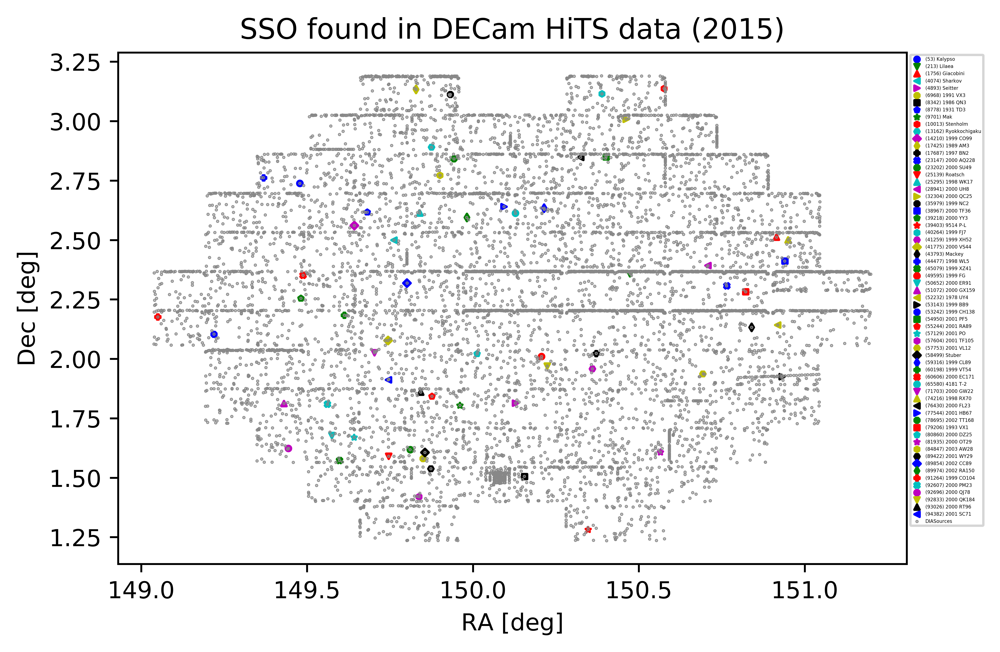

In [375]:
plt.figure(dpi=800)
m = ['o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X']
c = ['b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.xlabel('RA [deg]')
plt.ylabel('Dec [deg]')
plt.title('SSO found in DECam HiTS data (2015)')
i=0
for index,row in ssoFound.iterrows():
    plt.scatter(row['AstRA(deg)'],row['AstDec(deg)'], s=5, label=row['readableName'],c=c[np.mod(i,7)], marker=m[np.mod(i,15)])
    i=i+1
plt.scatter(diat0.ra,diat0.decl, s=0.5, c='#888888',label='DIASources', marker = MarkerStyle('.', fillstyle = 'none'))

plt.legend(bbox_to_anchor=(1.1, 1.0),prop={'size': 2})
plt.show()

In [293]:
ssoNotFound=notFoundInFOV.join(mpcorb, on="ObjID",rsuffix='_MPC')

In [294]:
ephemt0NoN;

In [295]:
ssoNotFound[outputCols]

,readableName,H,a,e,V,AstRA(deg),AstDec(deg),AstRARate(deg/day),AstDecRate(deg/day)
12,(9978) 1994 AJ1,13.2,2.989293,0.100943,17.404,150.527950,1.719564,-0.220781,0.040161
16,(14486) Tuscia,15.3,2.361979,0.069924,21.359,150.530444,2.870537,-0.190869,0.076005
27,(32605) Lucy,14.2,3.003089,0.209944,21.174,150.453319,3.041216,-0.209549,0.141911
46,(53113) 1999 AP8,15.0,2.287952,0.145884,19.594,150.574246,2.697541,-0.209607,0.052878
51,(55396) 2001 SZ287,14.7,2.591215,0.046180,19.828,150.911816,1.870568,-0.189526,0.204523
58,(59671) 1999 JW99,15.1,2.633413,0.285927,22.083,150.149168,1.724427,-0.205145,0.056953
65,(71981) 2000 WB153,16.4,2.248449,0.011803,19.100,149.810455,1.959287,-0.265815,0.077446
66,(72910) 2001 ND16,16.8,2.302528,0.157442,22.705,150.425745,2.544343,-0.253360,0.181590
67,(74188) 1998 RC43,15.2,2.654494,0.106465,19.273,150.894227,2.074069,-0.212959,0.029035
69,(76147) 2000 EY16,15.1,2.518052,0.125586,23.449,149.825491,2.819357,-0.251512,0.080633


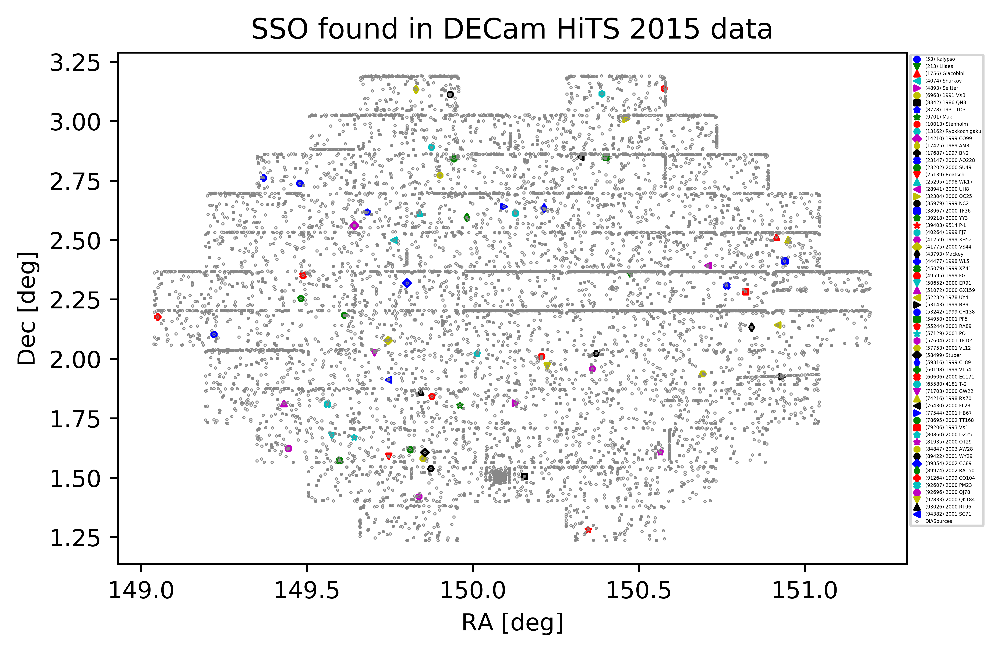

In [387]:
plotSSOinFOV(ssoFound,diat0,title='SSO found in DECam HiTS 2015 data')

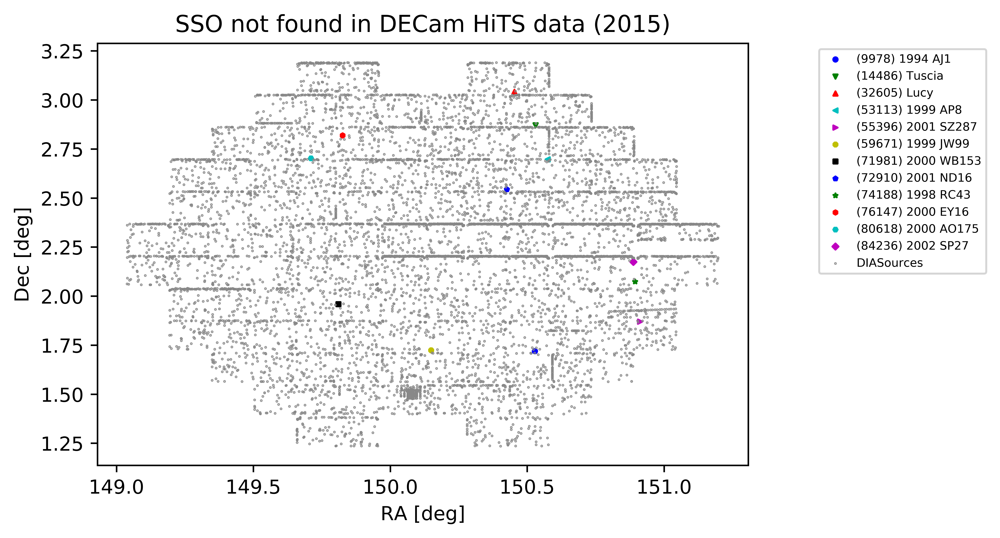

In [376]:
plt.figure(dpi=800)
plt.xlabel(xlabel)
plt.ylabel(ylabel)
m = ['o', 'v', '^', '<', '>', '8', 's', 'p', '*', 'h', 'H', 'D', 'd', 'P', 'X']
c = ['b', 'g', 'r', 'c', 'm', 'y', 'k']
plt.title('SSO not found in DECam HiTS data (2015)')
i=0
for index,row in ssoNotFound.iterrows():
    plt.scatter(row['AstRA(deg)'],row['AstDec(deg)'], s=5, label=row['readableName'],c=c[np.mod(i,7)], marker=m[np.mod(i,15)])
    i=i+1
plt.scatter(diat0.ra,diat0.decl, s=0.5, c='#888888',label='DIASources', marker = MarkerStyle('.', fillstyle = 'none'))

plt.legend(bbox_to_anchor=(1.1, 1.0),prop={'size': 6})
plt.show()